In [1]:
import os
import sys
import time
import io

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torch.utils.data as tdata
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from tqdm.notebook import tqdm
import wandb

In [ ]:
from anime_face_generator.config import PROCESSED_DATA_DIR, RAW_DATA_DIR, MODELS_DIR
import anime_face_generator.modeling.models.mini_unet_ddpm_10M as Mini
from anime_face_generator.modeling.train import train_model

%load_ext autoreload
%autoreload 2

2025-08-11 01:12:42.898 | INFO     | anime_face_generator.config:<module>:11 - PROJ_ROOT path is: /home/ayoubvip/anime_face_generator


![Algorithm1](https://learnopencv.com/wp-content/uploads/2023/02/denoising-diffusion-probabilistic-models_DDPM_trainig_inference_algorithm-1024x247.png)

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print("number of GPUs:", torch.cuda.device_count())

Using device: cuda
number of GPUs: 4


## Data augmentation

In [4]:
transformers = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=Mini.ModelParams.im_size),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

dataset = torchvision.datasets.ImageFolder(root=PROCESSED_DATA_DIR, transform=transformers, target_transform=None)

In [5]:
rand_gen = torch.Generator().manual_seed(1978)

## Unet Denoiser Architecture

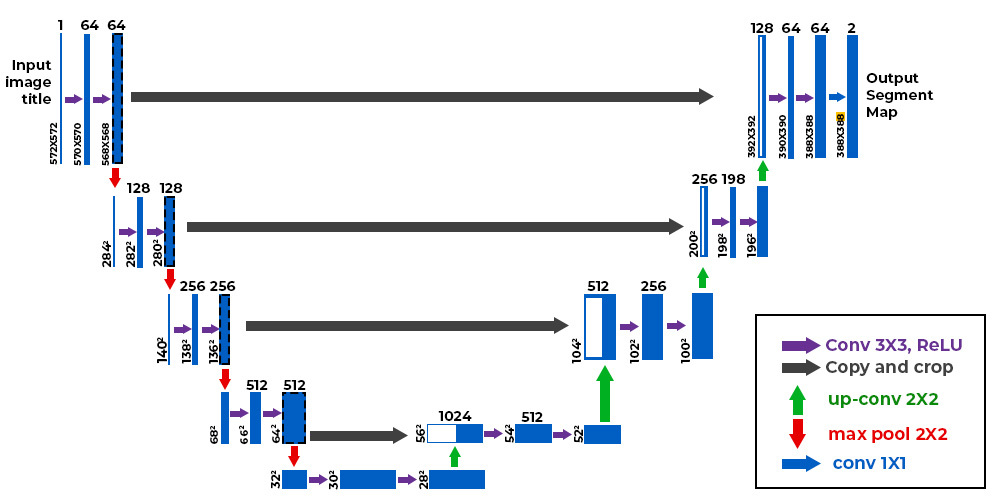

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: ayoub-dev2000 (ayoub-dev2000-university-of-liege) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


---------------------------------------------
 EPOCH 1
---------------------------------------------
train loss: 1.103741  [    5/72454]
val loss: 1.058196  [    5/72454]
timestep in first x in the batch:  553


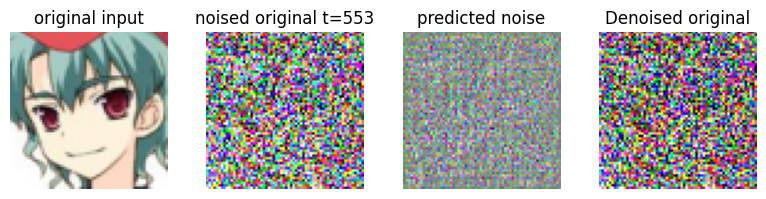

train loss: 0.078577  [ 4005/72454]
val loss: 0.079987  [ 4005/72454]
timestep in first x in the batch:  264


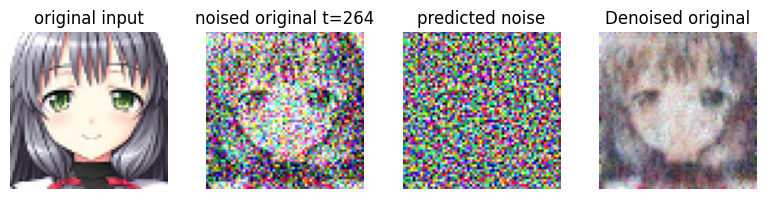

train loss: 0.081242  [ 8005/72454]
val loss: 0.058446  [ 8005/72454]
timestep in first x in the batch:  747


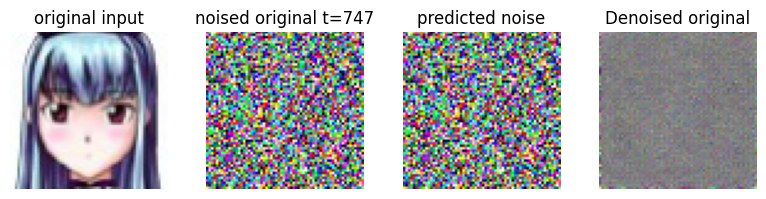

train loss: 0.021007  [12005/72454]
val loss: 0.047848  [12005/72454]
timestep in first x in the batch:  833


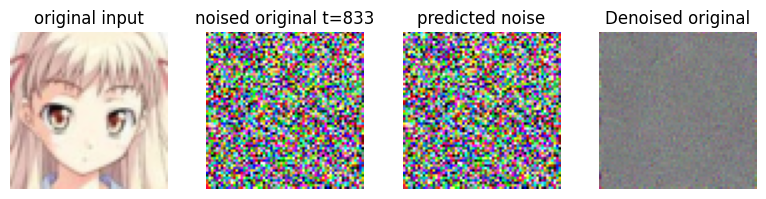

train loss: 0.034366  [16005/72454]
val loss: 0.045357  [16005/72454]
timestep in first x in the batch:  406


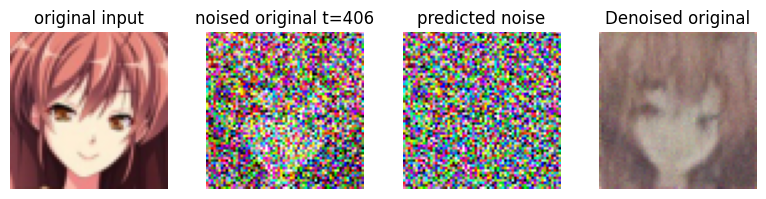

train loss: 0.011964  [20005/72454]
val loss: 0.043222  [20005/72454]
timestep in first x in the batch:  651


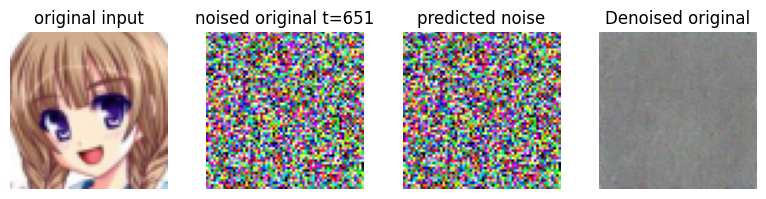

train loss: 0.011225  [24005/72454]
val loss: 0.043376  [24005/72454]
timestep in first x in the batch:  963


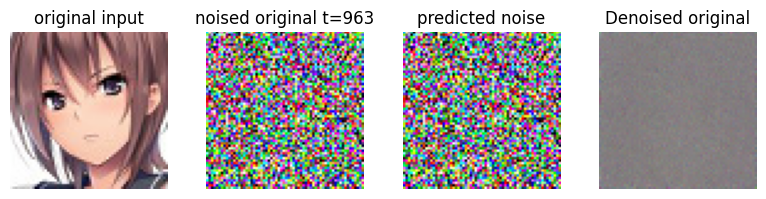

train loss: 0.107909  [28005/72454]
val loss: 0.036022  [28005/72454]
timestep in first x in the batch:  696


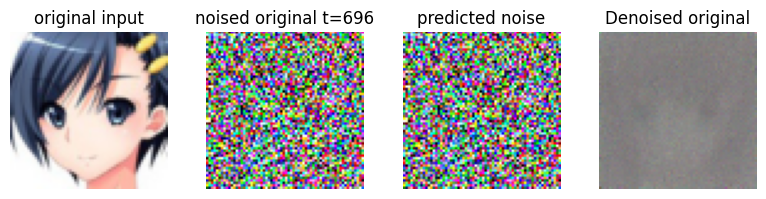

train loss: 0.097291  [32005/72454]
val loss: 0.037150  [32005/72454]
timestep in first x in the batch:  233


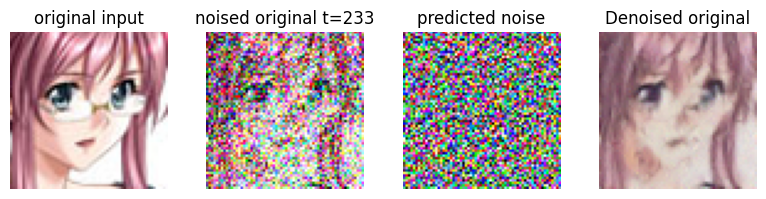

train loss: 0.037785  [36005/72454]
val loss: 0.042717  [36005/72454]
timestep in first x in the batch:  490


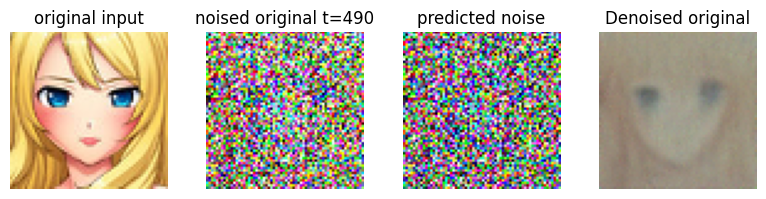

train loss: 0.027237  [40005/72454]
val loss: 0.034666  [40005/72454]
timestep in first x in the batch:  735


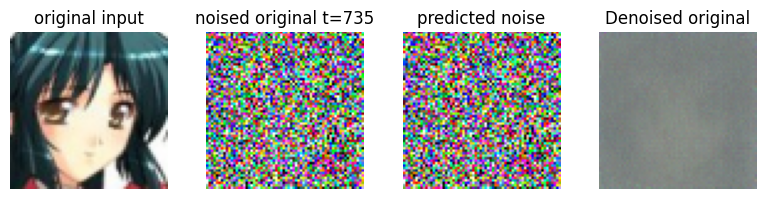

train loss: 0.074510  [44005/72454]
val loss: 0.038665  [44005/72454]
timestep in first x in the batch:  852


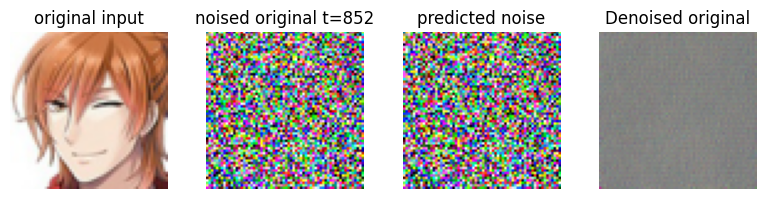

train loss: 0.033334  [48005/72454]
val loss: 0.033706  [48005/72454]
timestep in first x in the batch:  337


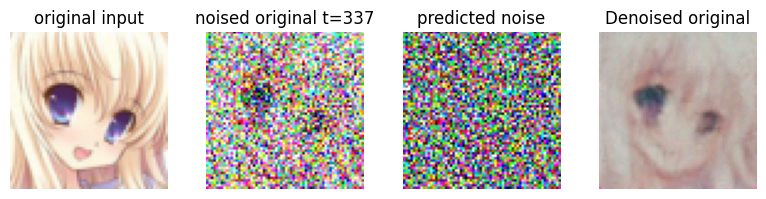

train loss: 0.013298  [52005/72454]
val loss: 0.031063  [52005/72454]
timestep in first x in the batch:  840


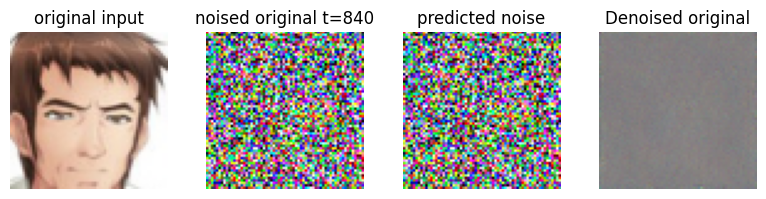

train loss: 0.048775  [56005/72454]
val loss: 0.032782  [56005/72454]
timestep in first x in the batch:  656


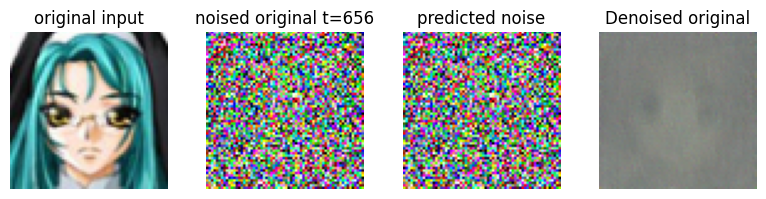

train loss: 0.053347  [60005/72454]
val loss: 0.034195  [60005/72454]
timestep in first x in the batch:  111


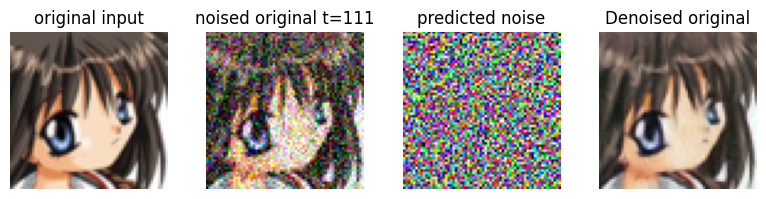

train loss: 0.011783  [64005/72454]
val loss: 0.033228  [64005/72454]
timestep in first x in the batch:  445


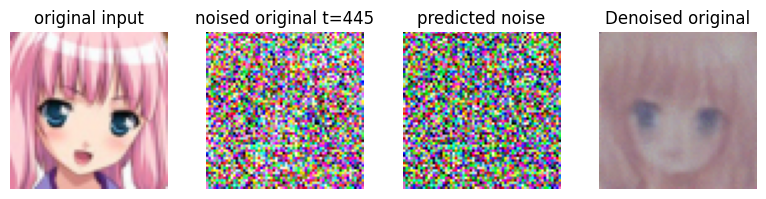

train loss: 0.009188  [68005/72454]
val loss: 0.034979  [68005/72454]
timestep in first x in the batch:  914


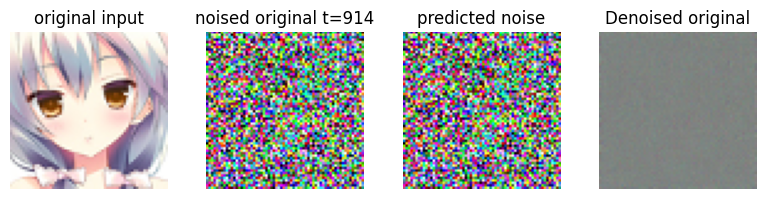

train loss: 0.022511  [72005/72454]
val loss: 0.034612  [72005/72454]
timestep in first x in the batch:  287


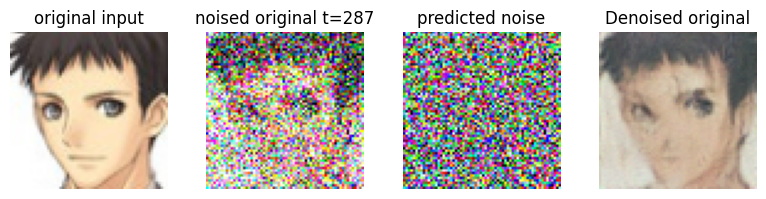

Epoch 1 finished
Model saved as mini_unet_ddpm_10M_ckpt_epoch_1.pth
---------------------------------------------
 EPOCH 2
---------------------------------------------
train loss: 0.055368  [    5/72454]
val loss: 0.029574  [    5/72454]
timestep in first x in the batch:  641


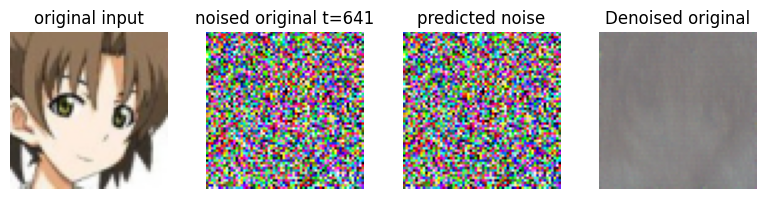

train loss: 0.043784  [ 4005/72454]
val loss: 0.037930  [ 4005/72454]
timestep in first x in the batch:  140


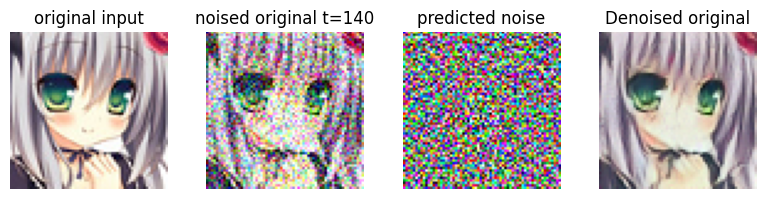

train loss: 0.017711  [ 8005/72454]
val loss: 0.036699  [ 8005/72454]
timestep in first x in the batch:  321


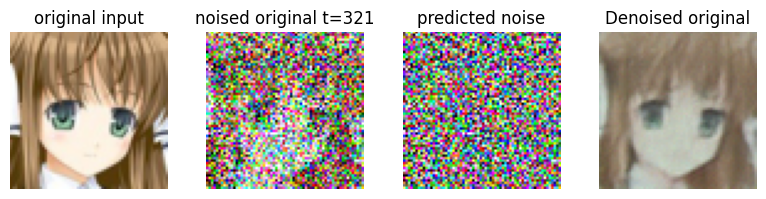

train loss: 0.083801  [12005/72454]
val loss: 0.034983  [12005/72454]
timestep in first x in the batch:  697


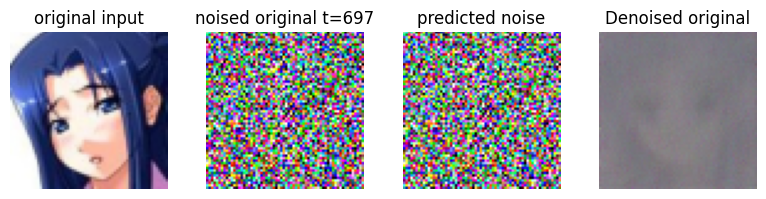

train loss: 0.030174  [16005/72454]
val loss: 0.032746  [16005/72454]
timestep in first x in the batch:  675


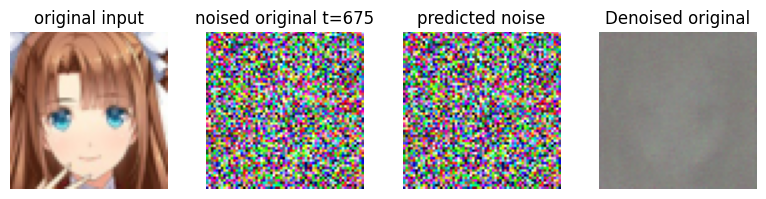

train loss: 0.015701  [20005/72454]
val loss: 0.033052  [20005/72454]
timestep in first x in the batch:  302


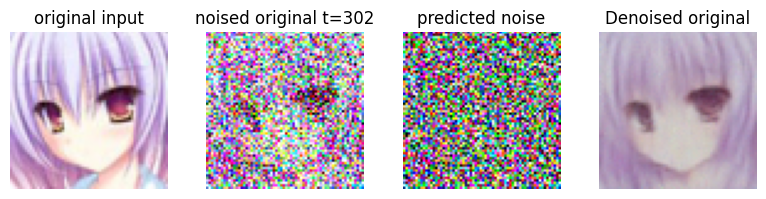

train loss: 0.058609  [24005/72454]
val loss: 0.032948  [24005/72454]
timestep in first x in the batch:  881


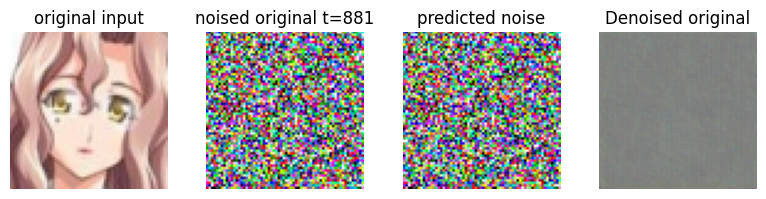

train loss: 0.027849  [28005/72454]
val loss: 0.033933  [28005/72454]
timestep in first x in the batch:  378


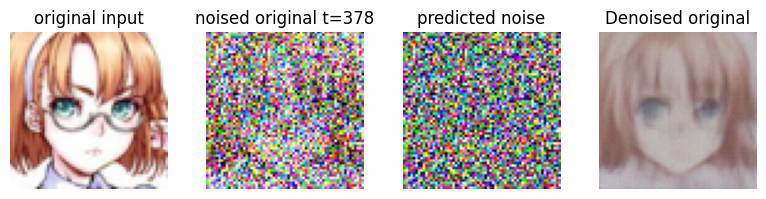

train loss: 0.016860  [32005/72454]
val loss: 0.030389  [32005/72454]
timestep in first x in the batch:  539


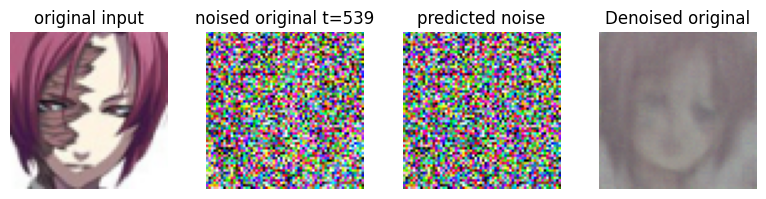

train loss: 0.008782  [36005/72454]
val loss: 0.034210  [36005/72454]
timestep in first x in the batch:  144


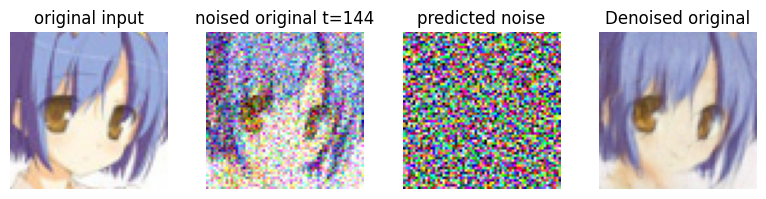

train loss: 0.040167  [40005/72454]
val loss: 0.034962  [40005/72454]
timestep in first x in the batch:  477


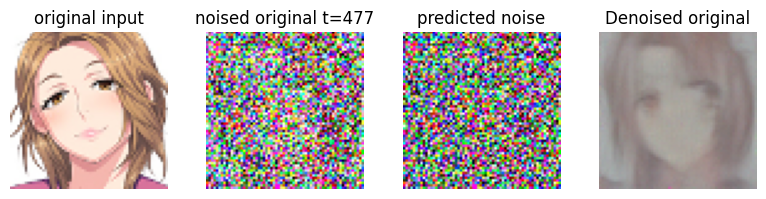

train loss: 0.035686  [44005/72454]
val loss: 0.034608  [44005/72454]
timestep in first x in the batch:  795


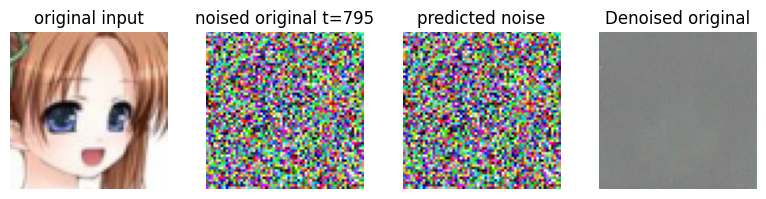

train loss: 0.039476  [48005/72454]
val loss: 0.033165  [48005/72454]
timestep in first x in the batch:  52


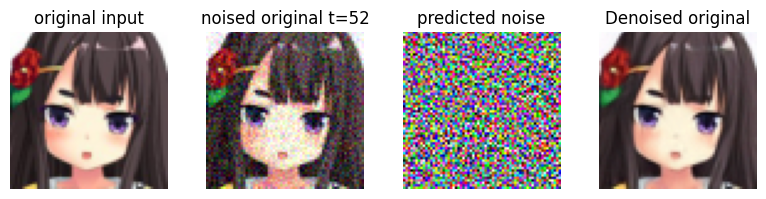

train loss: 0.014584  [52005/72454]
val loss: 0.027841  [52005/72454]
timestep in first x in the batch:  31


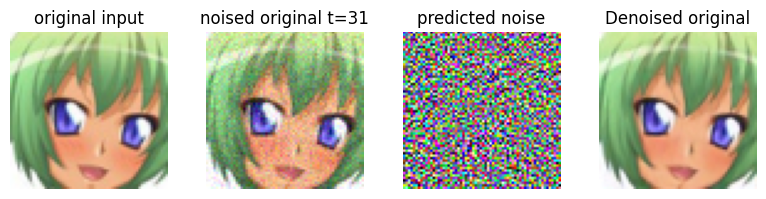

train loss: 0.012707  [56005/72454]
val loss: 0.036507  [56005/72454]
timestep in first x in the batch:  897


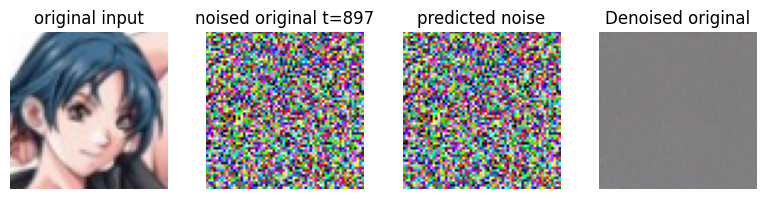

train loss: 0.048084  [60005/72454]
val loss: 0.028531  [60005/72454]
timestep in first x in the batch:  837


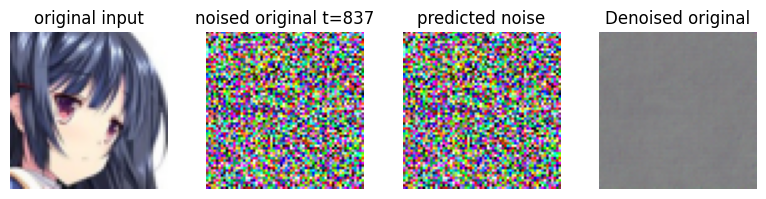

train loss: 0.005982  [64005/72454]
val loss: 0.028620  [64005/72454]
timestep in first x in the batch:  88


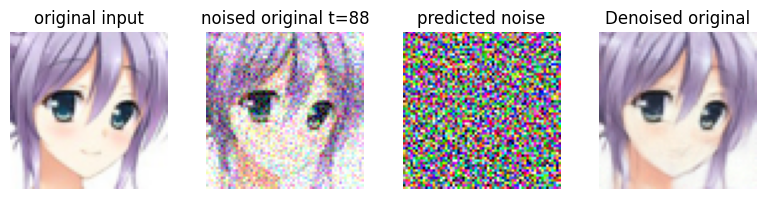

train loss: 0.073541  [68005/72454]
val loss: 0.033908  [68005/72454]
timestep in first x in the batch:  126


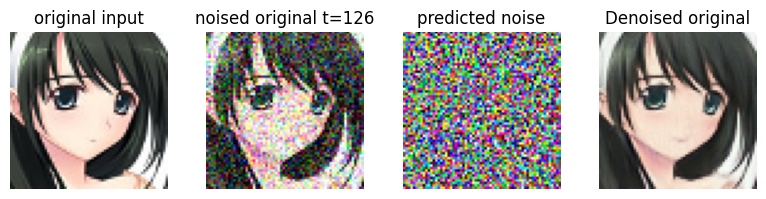

train loss: 0.003253  [72005/72454]
val loss: 0.030566  [72005/72454]
timestep in first x in the batch:  314


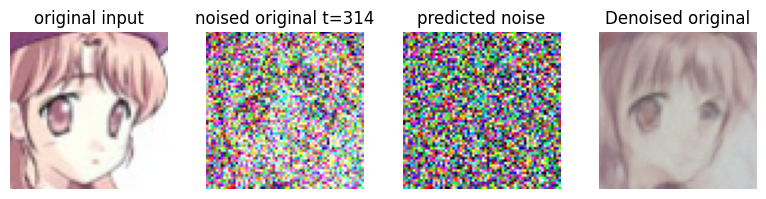

Epoch 2 finished
Model saved as mini_unet_ddpm_10M_ckpt_epoch_2.pth
---------------------------------------------
 EPOCH 3
---------------------------------------------
train loss: 0.031232  [    5/72454]
val loss: 0.028939  [    5/72454]
timestep in first x in the batch:  547


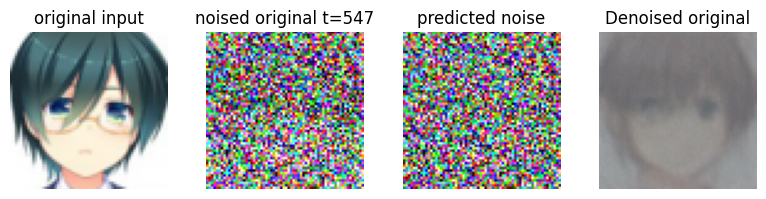

train loss: 0.017536  [ 4005/72454]
val loss: 0.028526  [ 4005/72454]
timestep in first x in the batch:  202


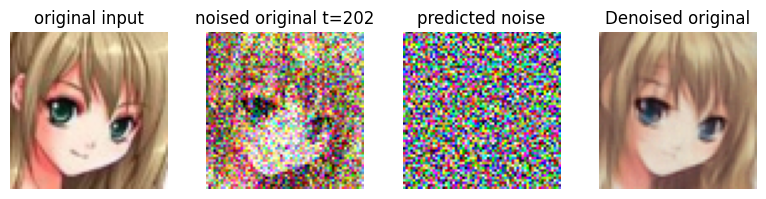

train loss: 0.038598  [ 8005/72454]
val loss: 0.034737  [ 8005/72454]
timestep in first x in the batch:  43


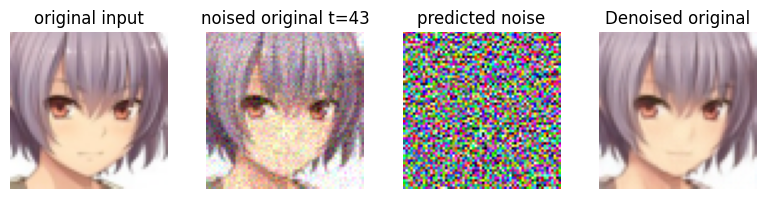

train loss: 0.027131  [12005/72454]
val loss: 0.033552  [12005/72454]
timestep in first x in the batch:  264


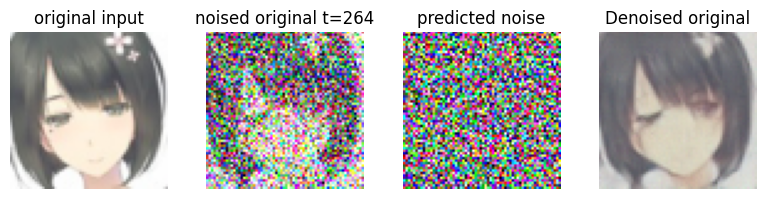

train loss: 0.107328  [16005/72454]
val loss: 0.028158  [16005/72454]
timestep in first x in the batch:  429


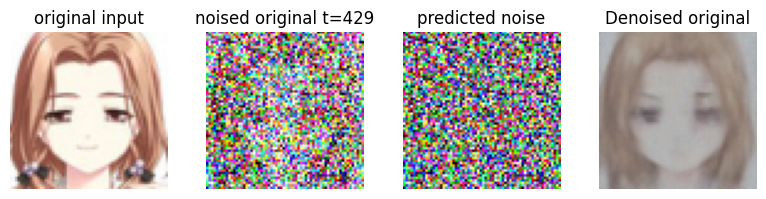

train loss: 0.014134  [20005/72454]
val loss: 0.034561  [20005/72454]
timestep in first x in the batch:  330


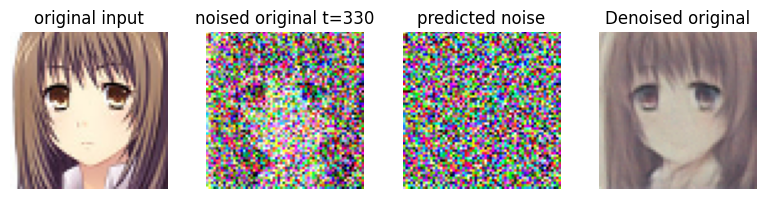

train loss: 0.040368  [24005/72454]
val loss: 0.026967  [24005/72454]
timestep in first x in the batch:  628


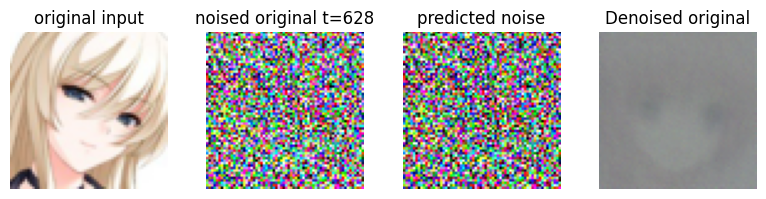

train loss: 0.029666  [28005/72454]
val loss: 0.033200  [28005/72454]
timestep in first x in the batch:  653


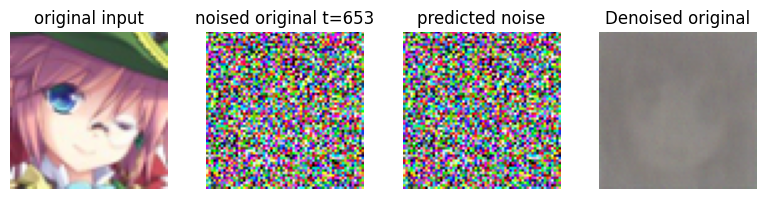

train loss: 0.021772  [32005/72454]
val loss: 0.028843  [32005/72454]
timestep in first x in the batch:  756


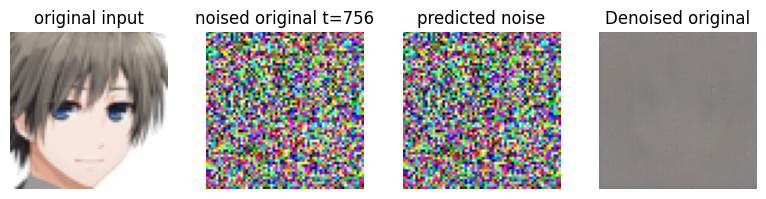

train loss: 0.038311  [36005/72454]
val loss: 0.031323  [36005/72454]
timestep in first x in the batch:  58


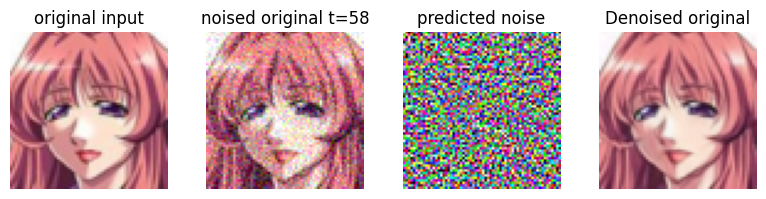

train loss: 0.023369  [40005/72454]
val loss: 0.031979  [40005/72454]
timestep in first x in the batch:  873


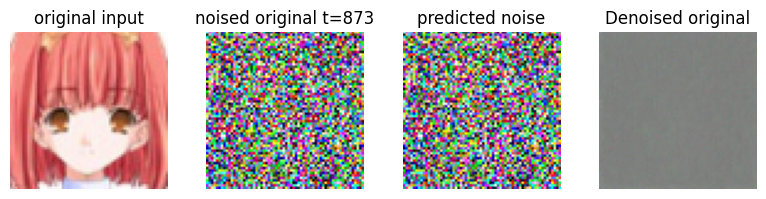

train loss: 0.048224  [44005/72454]
val loss: 0.028827  [44005/72454]
timestep in first x in the batch:  730


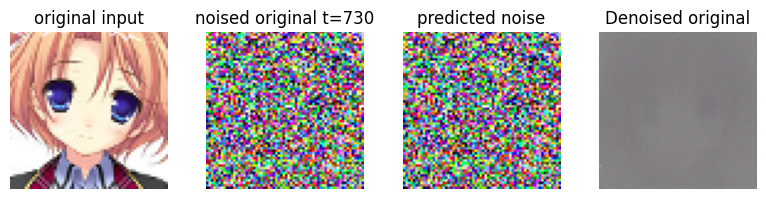

train loss: 0.006921  [48005/72454]
val loss: 0.031219  [48005/72454]
timestep in first x in the batch:  136


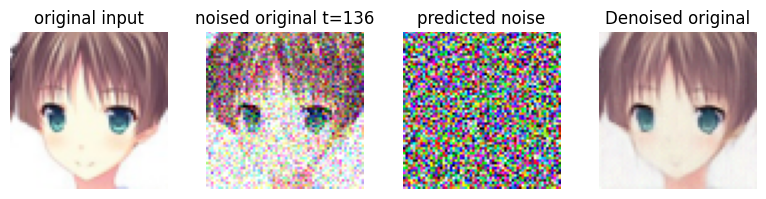

train loss: 0.005571  [52005/72454]
val loss: 0.034478  [52005/72454]
timestep in first x in the batch:  844


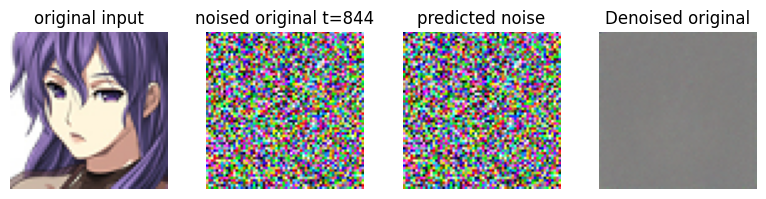

train loss: 0.012192  [56005/72454]
val loss: 0.030031  [56005/72454]
timestep in first x in the batch:  12


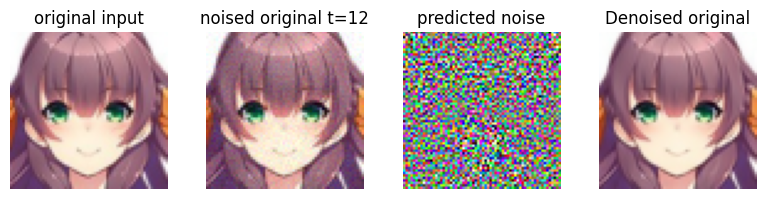

train loss: 0.069076  [60005/72454]
val loss: 0.030811  [60005/72454]
timestep in first x in the batch:  730


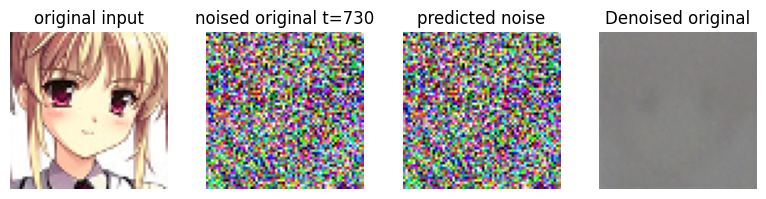

train loss: 0.042233  [64005/72454]
val loss: 0.027994  [64005/72454]
timestep in first x in the batch:  532


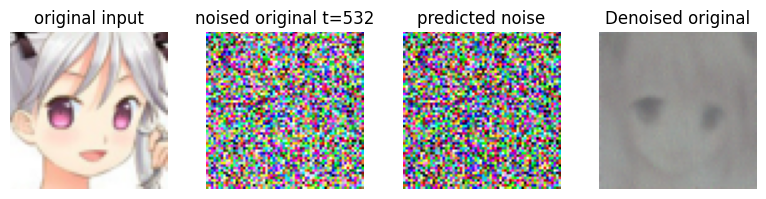

train loss: 0.012915  [68005/72454]
val loss: 0.033304  [68005/72454]
timestep in first x in the batch:  728


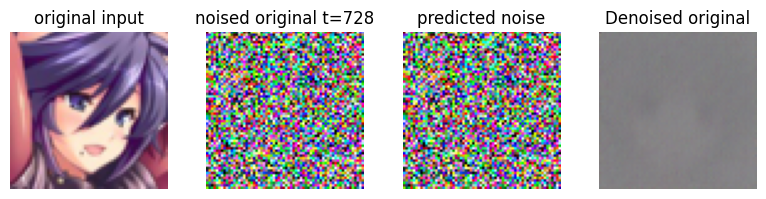

train loss: 0.004821  [72005/72454]
val loss: 0.031375  [72005/72454]
timestep in first x in the batch:  114


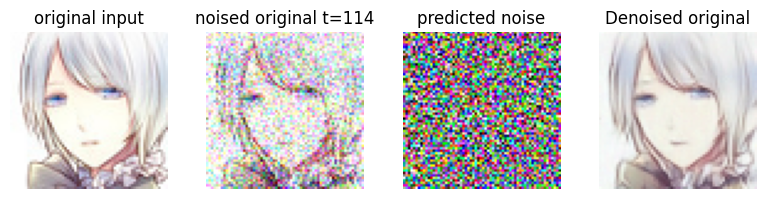

Epoch 3 finished
Model saved as mini_unet_ddpm_10M_ckpt_epoch_3.pth
---------------------------------------------
 EPOCH 4
---------------------------------------------
train loss: 0.085533  [    5/72454]
val loss: 0.027867  [    5/72454]
timestep in first x in the batch:  251


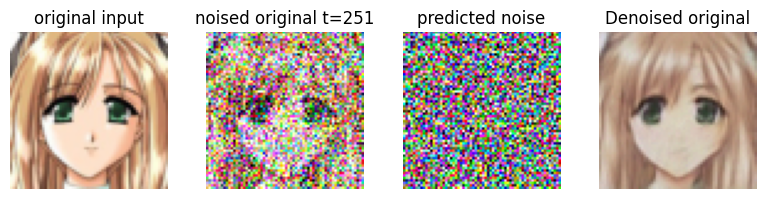

train loss: 0.013886  [ 4005/72454]
val loss: 0.029648  [ 4005/72454]
timestep in first x in the batch:  576


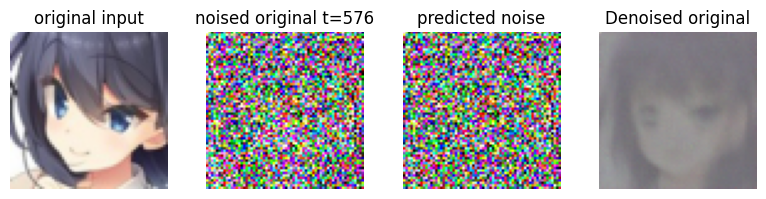

train loss: 0.015648  [ 8005/72454]
val loss: 0.027620  [ 8005/72454]
timestep in first x in the batch:  563


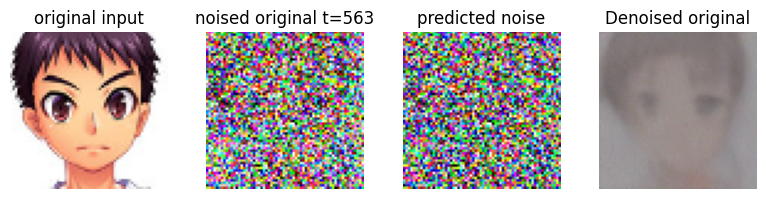

train loss: 0.006215  [12005/72454]
val loss: 0.029631  [12005/72454]
timestep in first x in the batch:  53


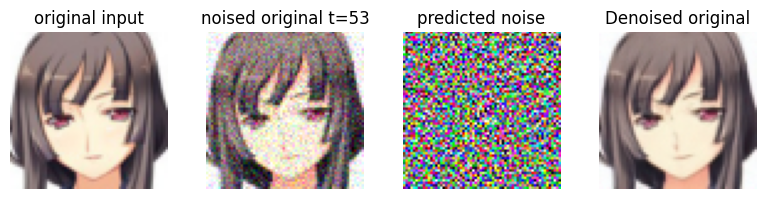

train loss: 0.002382  [16005/72454]
val loss: 0.031806  [16005/72454]
timestep in first x in the batch:  906


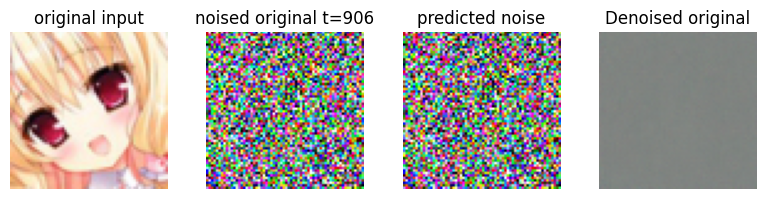

train loss: 0.032468  [20005/72454]
val loss: 0.030234  [20005/72454]
timestep in first x in the batch:  929


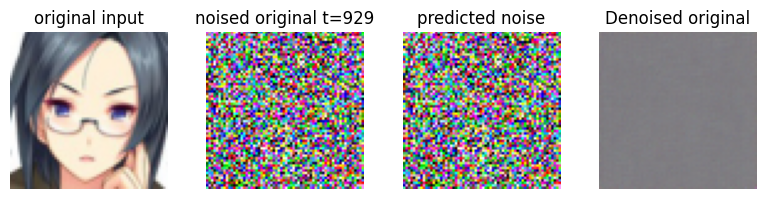

train loss: 0.002660  [24005/72454]
val loss: 0.030263  [24005/72454]
timestep in first x in the batch:  844


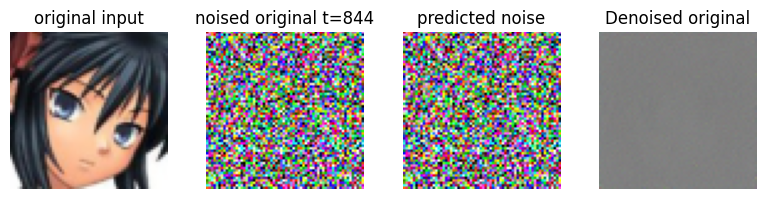

In [ ]:
torch.cuda.empty_cache()
giga_model_trained = train_model(module=Mini, dataset=dataset, device=device, rand_gen=rand_gen, wandb_logs=True)

## Simpling from the learned distribution

In [ ]:
@torch.no_grad()
def generate(model, shape=(1, 1, 64, 64)):
    x = torch.randn(shape).cuda()
    B = shape[0]    #batch size, number of samples to generate
    # Generate samples by reversing the diffusion process
    for t_step in reversed(range(T)):
        t = torch.full((B,), t_step, dtype=torch.long).to(x.device)
        x = p_sample(model, x, t)
    return x

 ### Saving the notebook.

In [ ]:
from ipylab import JupyterFrontEnd
app = JupyterFrontEnd()
app.commands.execute('docmanager:save')